In [1]:
import zipfile
import os
import seaborn
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import json
import seaborn as sns


In [49]:
import datetime

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adam

# ignoring warnings
import warnings
warnings.simplefilter("ignore")

import os, cv2, json
# from PIL import Image

In [3]:
! pip install kaggle  

In [4]:


! mkdir ~/.kaggle



In [5]:



! cp kaggle.json ~/.kaggle/


! chmod 600 ~/.kaggle/kaggle.json



cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [6]:
!kaggle competitions download -c cassava-leaf-disease-classification

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 166, in authenticate
    self.config_file, self.config_dir))
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [51]:
BASE_DIR = "./"
data = pd.read_csv('./train.csv')
train_path = './cassava-leaf-disease-classification/train_images'

In [12]:
from google.colab import  drive
drive.mount('/content/drive')
path = "/content/drive/My Drive/cassava-leaf-disease-classification.zip"
zip_file  = zipfile.ZipFile(path, 'r') 
zip_file.extractall()
train_images = os.listdir('./train_images')

Mounted at /content/drive


In [13]:
print(train_images[:50])

['2887524398.jpg', '2516584960.jpg', '1950403407.jpg', '2199327268.jpg', '3476106510.jpg', '3775506887.jpg', '1549044290.jpg', '2066357656.jpg', '1138036719.jpg', '2953610226.jpg', '2760272941.jpg', '3227241353.jpg', '3815339672.jpg', '3371952476.jpg', '3552888499.jpg', '2971637330.jpg', '1714717170.jpg', '1148829591.jpg', '3085864631.jpg', '224347038.jpg', '2732746360.jpg', '1505566999.jpg', '2409113043.jpg', '726278005.jpg', '2468769812.jpg', '3770952591.jpg', '1354623867.jpg', '2138098761.jpg', '114081332.jpg', '1276467932.jpg', '3328736018.jpg', '2807877356.jpg', '2515947948.jpg', '3264451283.jpg', '1240563843.jpg', '2591512488.jpg', '1149376590.jpg', '4182496583.jpg', '2830245641.jpg', '636559480.jpg', '2463068733.jpg', '3889601162.jpg', '614181171.jpg', '2744558687.jpg', '2240905108.jpg', '2679180771.jpg', '952111080.jpg', '3312515424.jpg', '2049551156.jpg', '2247714957.jpg']


In [14]:
print(len(train_images))

21397


In [16]:


with open(os.path.join(BASE_DIR, "label_num_to_disease_map.json")) as file:
    map_classes = json.loads(file.read())
    map_classes = {int(k) : v for k, v in map_classes.items()}
    
f = open('./label_num_to_disease_map.json')

real_labels = json.load(f)

real_labels = {int(k):v for k,v in real_labels.items()}

print(real_labels)

{0: 'Cassava Bacterial Blight (CBB)', 1: 'Cassava Brown Streak Disease (CBSD)', 2: 'Cassava Green Mottle (CGM)', 3: 'Cassava Mosaic Disease (CMD)', 4: 'Healthy'}


In [17]:
img_shapes = {}
for image_name in os.listdir(os.path.join("./", "train_images"))[:300]:
    image = cv2.imread(os.path.join("./", "train_images", image_name))
    img_shapes[image.shape] = img_shapes.get(image.shape, 0) + 1

print(img_shapes)

{(600, 800, 3): 300}


In [18]:
df_train = pd.read_csv(os.path.join(BASE_DIR, "train.csv"))

df_train["class_name"] = df_train["label"].map(map_classes)

df_train


,image_id,label,class_name
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)
...,...,...,...
21392,999068805.jpg,3,Cassava Mosaic Disease (CMD)
21393,999329392.jpg,3,Cassava Mosaic Disease (CMD)
21394,999474432.jpg,1,Cassava Brown Streak Disease (CBSD)
21395,999616605.jpg,4,Healthy


In [19]:
input_files = os.listdir(os.path.join(BASE_DIR, "train_images"))
print(f"Number of train images: {len(input_files)}")

Number of train images: 21397


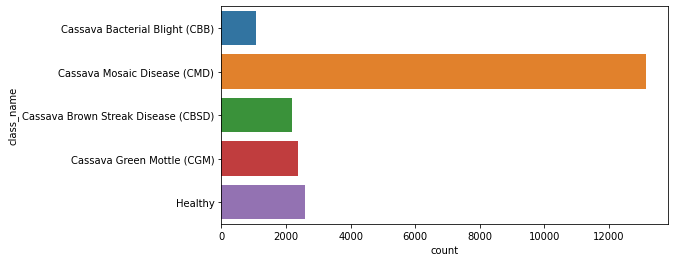

In [20]:
plt.figure(figsize=(8, 4))
seaborn.countplot(y="class_name", data=df_train);


In [21]:


def showImages(images):

    # Extract 16 random images from it
    random_images = [np.random.choice(images) for i in range(16)]

    # Adjust the size of your images
    plt.figure(figsize=(16,12))

    # Iterate and plot random images
    for i in range(16):
        plt.subplot(4,4, i + 1)
        img = plt.imread("./train_images"+'/'+random_images[i])
        plt.imshow(img, cmap='gray')
        plt.axis('off')

    # Adjust subplot parameters to give specified padding
    plt.tight_layout()  



In [22]:


mask = data['label'] ==4
classHealthy = data[mask]



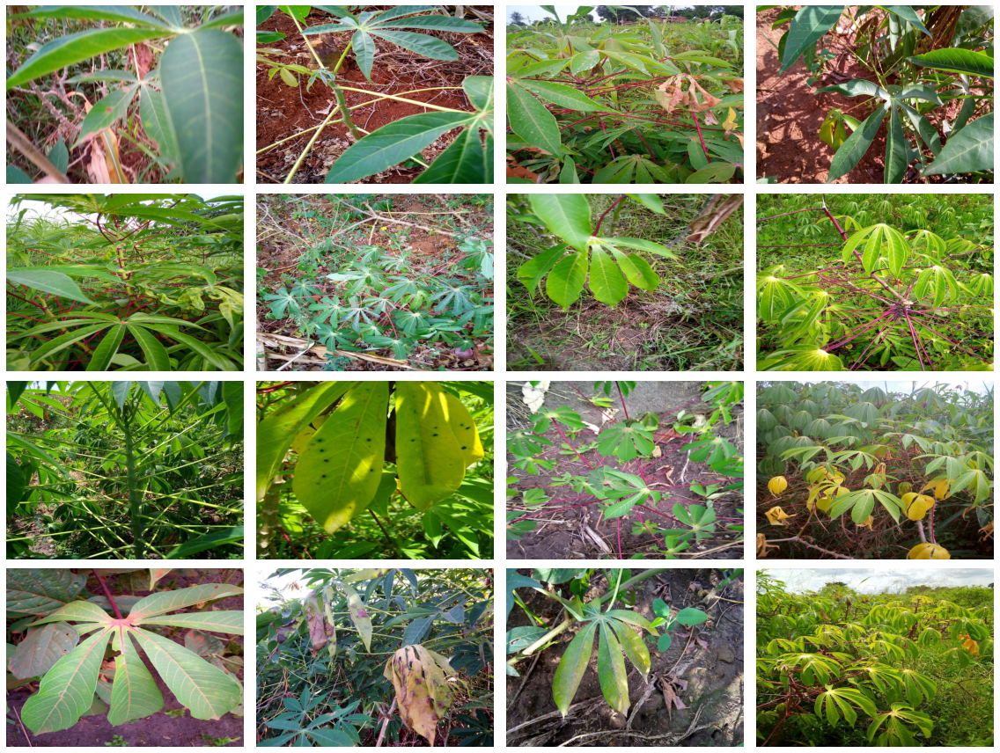

In [23]:
showImages(classHealthy['image_id'])

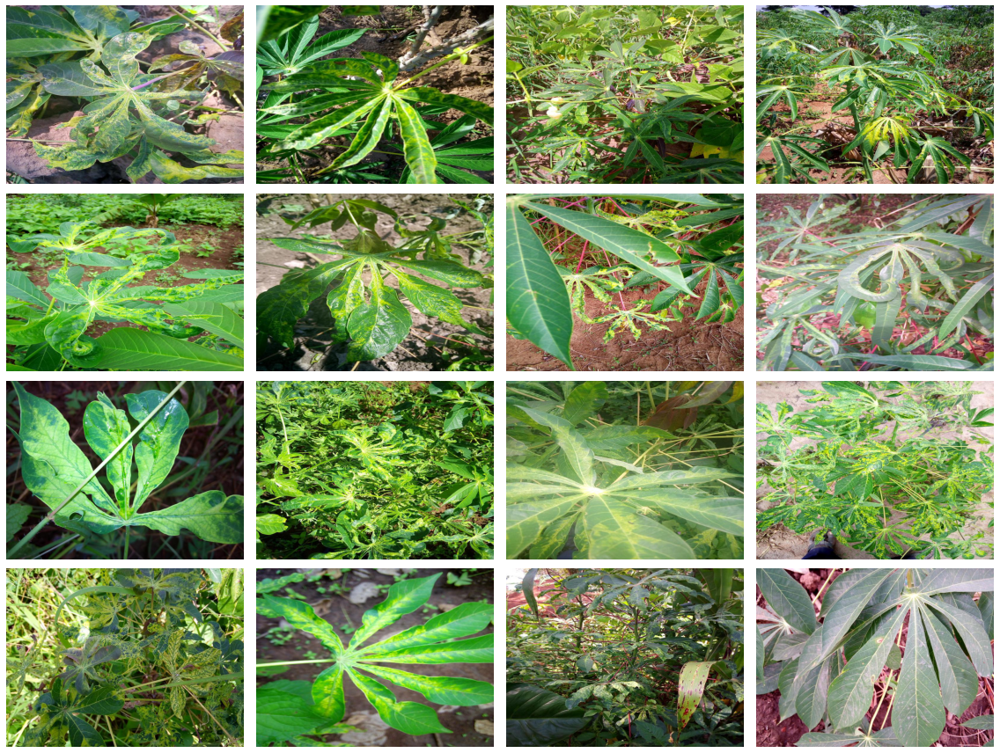

In [24]:


mask = data['label'] ==3
classCGM = data[mask]
showImages(classCGM['image_id'])



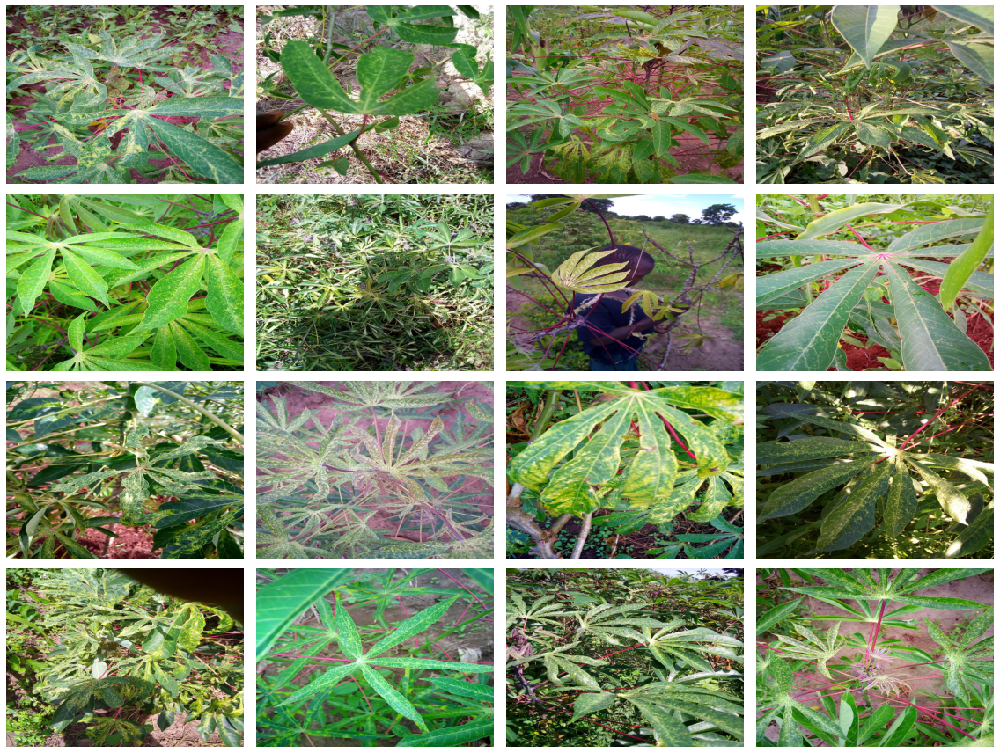

In [25]:
mask = data['label'] ==2
classCBSD = data[mask]
showImages(classCBSD['image_id'])

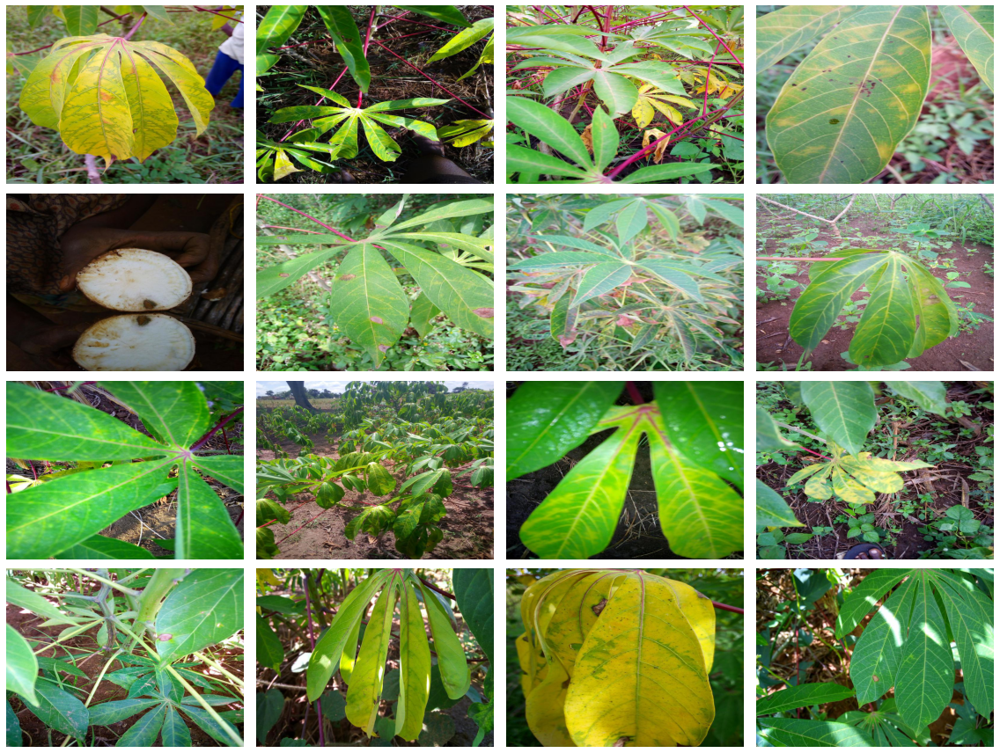

In [26]:
mask = data['label'] ==1
classCMD = data[mask]
showImages(classCMD['image_id'])

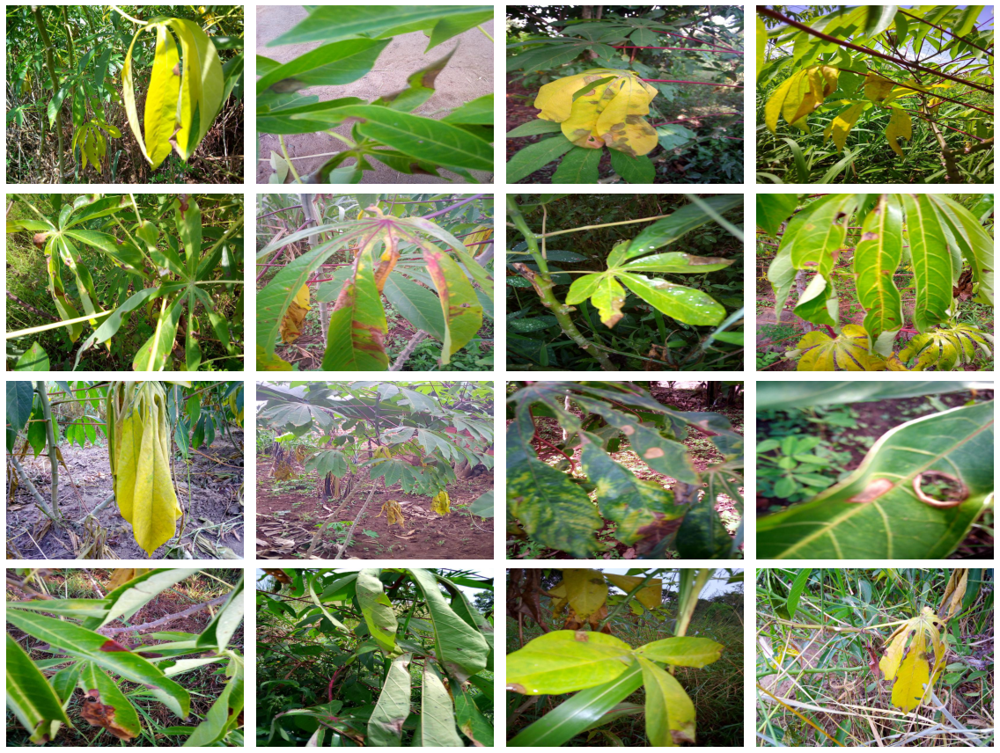

In [27]:
mask = data['label'] ==0
classCBB = data[mask]
showImages(classCBB['image_id'])

In [28]:
print('Train images: %d' %len(os.listdir(
    os.path.join(BASE_DIR, "train_images"))))

Train images: 21397


In [29]:


train_labels = pd.read_csv(os.path.join(BASE_DIR, "train.csv"))
train_labels.head()



,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


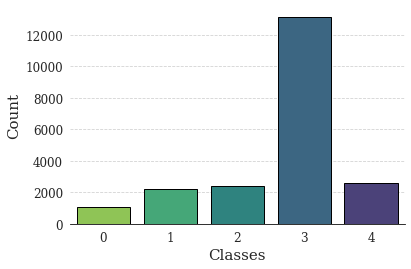

In [30]:


sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize = (6, 4))

for i in ['top', 'right', 'left']:
    ax.spines[i].set_visible(False)
ax.spines['bottom'].set_color('black')

sns.countplot(train_labels.label, edgecolor = 'black',
              palette = reversed(sns.color_palette("viridis", 5)))
plt.xlabel('Classes', fontfamily = 'serif', size = 15)
plt.ylabel('Count', fontfamily = 'serif', size = 15)
plt.xticks(fontfamily = 'serif', size = 12)
plt.yticks(fontfamily = 'serif', size = 12)
ax.grid(axis = 'y', linestyle = '--', alpha = 0.9)
plt.show()



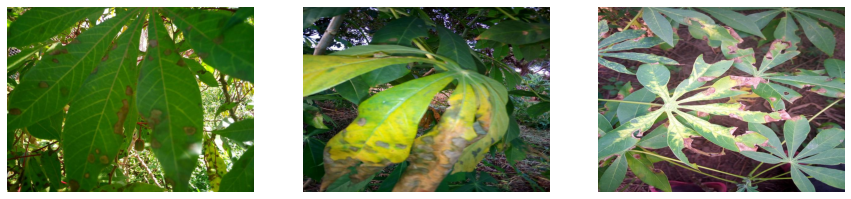

In [31]:
sample = train_labels[train_labels.label == 0].sample(3)
plt.figure(figsize=(15, 5))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(1, 3, ind + 1)
    img = cv2.imread(os.path.join(BASE_DIR, "train_images", image_id))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis("off")
    
plt.show()

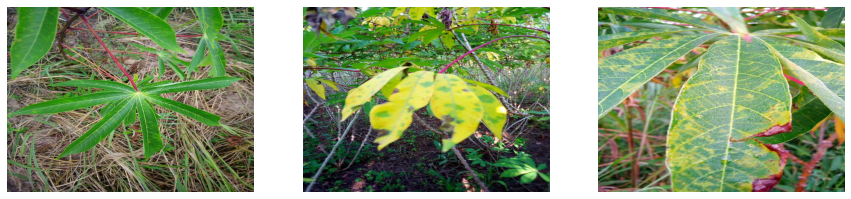

In [32]:
sample = train_labels[train_labels.label == 1].sample(3)
plt.figure(figsize=(15, 5))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(1, 3, ind + 1)
    img = cv2.imread(os.path.join(BASE_DIR, "train_images", image_id))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis("off")
    
plt.show()

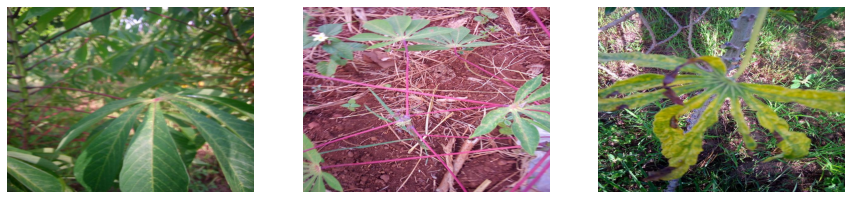

In [33]:
sample = train_labels[train_labels.label == 2].sample(3)
plt.figure(figsize=(15, 5))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(1, 3, ind + 1)
    img = cv2.imread(os.path.join(BASE_DIR, "train_images", image_id))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis("off")
    
plt.show()

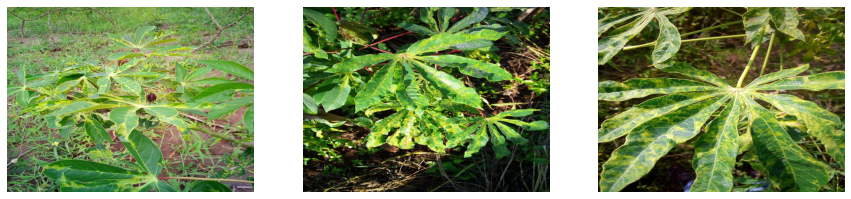

In [34]:
sample = train_labels[train_labels.label == 3].sample(3)
plt.figure(figsize=(15, 5))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(1, 3, ind + 1)
    img = cv2.imread(os.path.join(BASE_DIR, "train_images", image_id))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis("off")
    
plt.show()


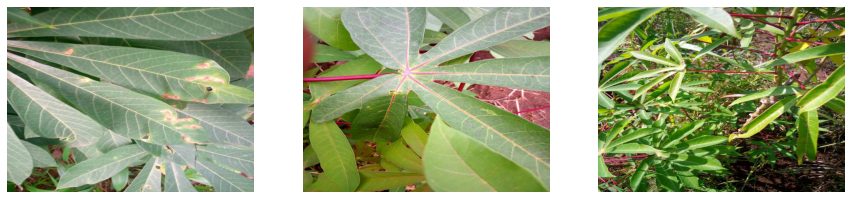

In [35]:
sample = train_labels[train_labels.label == 4].sample(3)
plt.figure(figsize=(15, 5))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(1, 3, ind + 1)
    img = cv2.imread(os.path.join(BASE_DIR, "train_images", image_id))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis("off")
    
plt.show()

In [62]:
BATCH_SIZE = 8
STEPS_PER_EPOCH = 20 #len(train_labels)*0.8 / BATCH_SIZE
VALIDATION_STEPS = len(train_labels)*0.2 / BATCH_SIZE
EPOCHS = 20
TARGET_SIZE = 500

In [63]:


train_labels.label = train_labels.label.astype('str')

train_datagen = ImageDataGenerator(validation_split = 0.2,
                                     preprocessing_function = None,
                                     rotation_range = 45,
                                     zoom_range = 0.2,
                                     horizontal_flip = True,
                                     vertical_flip = True,
                                     fill_mode = 'nearest',
                                     shear_range = 0.1,
                                     height_shift_range = 0.1,
                                     width_shift_range = 0.1)

train_generator = train_datagen.flow_from_dataframe(train_labels,
                         directory = os.path.join(BASE_DIR, "train_images"),
                         subset = "training",
                         x_col = "image_id",
                         y_col = "label",
                         target_size = (TARGET_SIZE, TARGET_SIZE),
                         batch_size = BATCH_SIZE,
                         class_mode = "sparse")


validation_datagen = ImageDataGenerator(validation_split = 0.2)

validation_generator = validation_datagen.flow_from_dataframe(train_labels,
                         directory = os.path.join(BASE_DIR, "train_images"),
                         subset = "validation",
                         x_col = "image_id",
                         y_col = "label",
                         target_size = (TARGET_SIZE, TARGET_SIZE),
                         batch_size = BATCH_SIZE,
                      

   class_mode = "sparse")



Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.


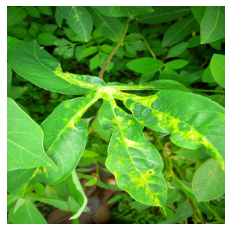

In [64]:
img_path = os.path.join(BASE_DIR, "train_images", train_labels.image_id[20])
img = image.load_img(img_path, target_size = (TARGET_SIZE, TARGET_SIZE))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis = 0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.axis('off')
plt.show()

Found 1 validated image filenames belonging to 1 classes.


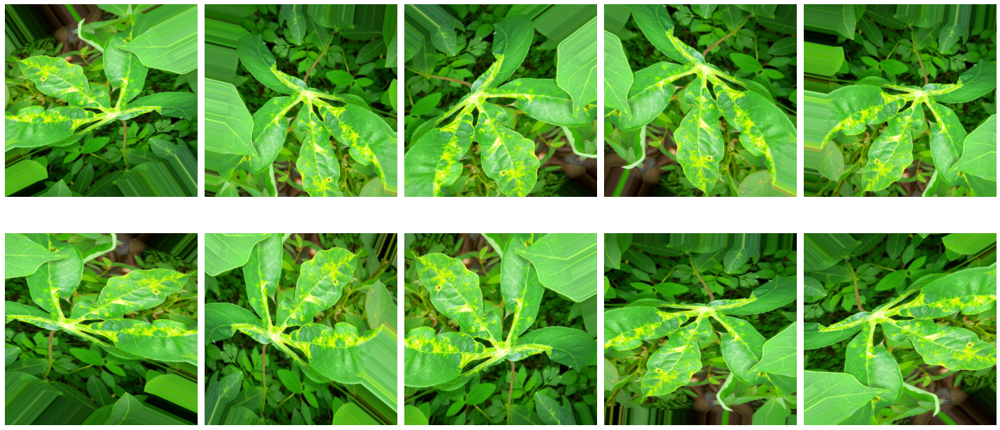

In [65]:


generator = train_datagen.flow_from_dataframe(train_labels.iloc[20:21],
                         directory = os.path.join(BASE_DIR, "train_images"),
                         x_col = "image_id",
                         y_col = "label",
                         target_size = (TARGET_SIZE, TARGET_SIZE),
                         batch_size = BATCH_SIZE,
                         class_mode = "sparse")

aug_images = [generator[0][0][0]/255 for i in range(10)]
fig, axes = plt.subplots(2, 5, figsize = (20, 10))
axes = axes.flatten()
for img, ax in zip(aug_images, axes):
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show()



In [66]:
# Code for basic EfficientNetB0 CNN

def create_model():
    conv_base = EfficientNetB0(include_top = False, weights = 'imagenet',
                               input_shape = (TARGET_SIZE, TARGET_SIZE, 3))
    model = conv_base.output
    model = layers.GlobalAveragePooling2D()(model)
    model = layers.Dense(5, activation = "softmax")(model)
    model = models.Model(conv_base.input, model)

    model.compile(optimizer = Adam(lr = 0.001),
                  loss = "sparse_categorical_crossentropy",
                  metrics = ["acc"])
    return model

model = create_model()
model.summary()


Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 500, 500, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_4 (Rescaling)        (None, 500, 500, 3)  0           ['input_5[0][0]']                
                                                                                                  
 normalization_4 (Normalization  (None, 500, 500, 3)  7          ['rescaling_4[0][0]']            
 )                                                                                                
                                                                                            

In [67]:
 model.save('./basic_EfNetB0_imagenet_512.h5')

In [68]:
def create_model():
    conv_base = EfficientNetB0(include_top = False, weights = None,
                               input_shape = (TARGET_SIZE, TARGET_SIZE, 3))
    model = conv_base.output
    model = layers.GlobalAveragePooling2D()(model)
    model = layers.Dense(5, activation = "softmax")(model)
    model = models.Model(conv_base.input, model)

    model.compile(optimizer = Adam(lr = 0.001),
                  loss = "sparse_categorical_crossentropy",
                  metrics = ["acc"])
    return model

In [69]:


model = create_model()
model.summary()



Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 500, 500, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_5 (Rescaling)        (None, 500, 500, 3)  0           ['input_6[0][0]']                
                                                                                                  
 normalization_5 (Normalization  (None, 500, 500, 3)  7          ['rescaling_5[0][0]']            
 )                                                                                                
                                                                                            

In [70]:
print('Our EfficientNet CNN has %d layers' %len(model.layers))

Our EfficientNet CNN has 239 layers


In [71]:
model.load_weights('./basic_EfNetB0_imagenet_512.h5')
# model.load_weights('../input/cassava-leaf-disease-models/basic_EfNetB0_imagenet_512.h5')

In [ ]:
model_save = ModelCheckpoint('./EffNetB0_512_8_best_weights.h5', 
                             save_best_only = True, 
                             save_weights_only = True,
                             monitor = 'val_loss', 
                             mode = 'min', verbose = 1)
early_stop = EarlyStopping(monitor = 'val_loss', min_delta = 0.001, 
                           patience = 5, mode = 'min', verbose = 1,
                           restore_best_weights = True)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.3, 
                              patience = 2, min_delta = 0.001, 
                              mode = 'min', verbose = 1)


history = model.fit(
    train_generator,
    steps_per_epoch = STEPS_PER_EPOCH,
    epochs = EPOCHS,
    validation_data = validation_generator,
    validation_steps = VALIDATION_STEPS,
    callbacks = [model_save, early_stop, reduce_lr]
)



Epoch 1/20
20/20 [==============================] - ETA: 0s - loss: 1.1961 - acc: 0.5688
Epoch 1: val_loss improved from inf to 1.04376, saving model to ./EffNetB0_512_8_best_weights.h5
20/20 [==============================] - 1210s 62s/step - loss: 1.1961 - acc: 0.5688 - val_loss: 1.0438 - val_acc: 0.6745 - lr: 0.0010
Epoch 2/20
20/20 [==============================] - ETA: 0s - loss: 0.8575 - acc: 0.6375
Epoch 2: val_loss did not improve from 1.04376
20/20 [==============================] - 1218s 63s/step - loss: 0.8575 - acc: 0.6375 - val_loss: 1.7348 - val_acc: 0.6925 - lr: 0.0010
Epoch 3/20
20/20 [==============================] - ETA: 0s - loss: 0.6868 - acc: 0.7688 
Epoch 3: val_loss did not improve from 1.04376

Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
20/20 [==============================] - 1312s 68s/step - loss: 0.6868 - acc: 0.7688 - val_loss: 1.6496 - val_acc: 0.6936 - lr: 0.0010
Epoch 4/20
20/20 [==============================] - ETA: 0s

In [105]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
sns.set_style("white")
plt.suptitle('Train history', size = 15)

ax1.plot(epochs, acc, "bo", label = "Training acc")
ax1.plot(epochs, val_acc, "b", label = "Validation acc")
ax1.set_title("Training and validation acc")
ax1.legend()

ax2.plot(epochs, loss, "bo", label = "Training loss", color = 'red')
ax2.plot(epochs, val_loss, "b", label = "Validation loss", color = 'red')
ax2.set_title("Training and validation loss")
ax2.legend()

plt.show()


NameError: ignored

In [106]:
def activation_layer_vis(img, activation_layer = 0, layers = 10):
    layer_outputs = [layer.output for layer in model.layers[:layers]]
    activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
    activations = activation_model.predict(img)
    
    rows = int(activations[activation_layer].shape[3] / 3)
    cols = int(activations[activation_layer].shape[3] / rows)
    fig, axes = plt.subplots(rows, cols, figsize = (15, 15 * cols))
    axes = axes.flatten()
    
    for i, ax in zip(range(activations[activation_layer].shape[3]), axes):
        ax.matshow(activations[activation_layer][0, :, :, i], cmap = 'viridis')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

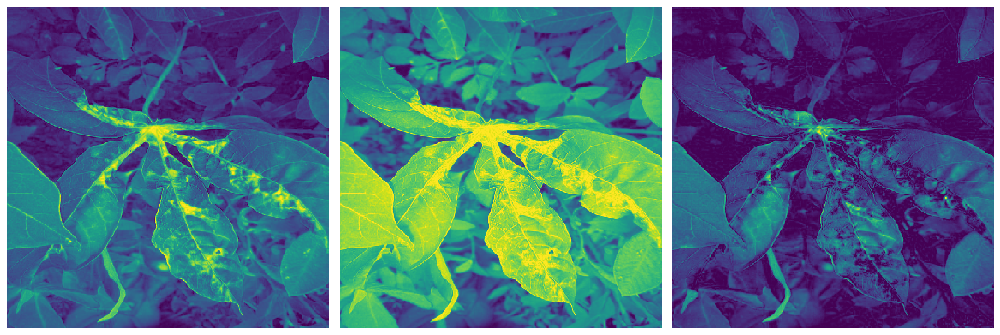

In [107]:
activation_layer_vis(img_tensor, 0)